<a href="https://colab.research.google.com/github/mzafir/aps/blob/master/Assignment_Solution_YOLO_v1_AZ.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Mounting the asset directory containing dataset

In [ ]:
import os

local_assets_b = False

if local_assets_b:
  assets_dir = "/content/assets/P3/"

  if not os.path.isdir(assets_dir):
    assert os.path.isfile("assets.zip")
    os.system("unzip assets.zip")
else:
  from google.colab import drive
  drive.mount('/content/drive')
  assets_dir = '/content/drive/MyDrive/CV-2/assets/P3/'

Mounted at /content/drive


# Object Detection using YOLO

In [ ]:
import torch
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import models
import numpy as np
device = 'cuda' if torch.cuda.is_available() else 'cpu'

### Unzip the dataset

We unzip the dataset and generate labels for each image.

In [ ]:
source_path = assets_dir + "PascalVOC.zip"
destination_dir = "/content/PascalVOC/"
!unzip "{source_path}" -d {destination_dir}

### What is PascalVOC?

The Pascal Visual Object Classes (VOC) dataset is a widely used benchmark dataset in the field of computer vision. It was created to evaluate object detection, segmentation, and classification algorithms. The dataset contains images from 20 different object categories, including common objects like cars, cats, dogs, and various types of everyday items.

Here are some key characteristics of the PascalVOC dataset:

Object Categories: The dataset covers 20 object categories, including animals (such as birds, cats, and dogs), vehicles (like cars and bicycles), and indoor objects (such as chairs and TVs).

Annotations: Each image in the dataset is annotated with bounding boxes around objects of interest. These annotations provide the coordinates (x, y, width, height) of the bounding box, as well as the class label corresponding to the object category.

Dataset Splits: The dataset is typically divided into two subsets: training and testing. The training set is used to train machine learning models, and the testing set is used to evaluate the final model performance.

Image Variability: The dataset contains images with diverse backgrounds, lighting conditions, and object poses. This variability challenges algorithms to generalize well to different real-world scenarios.

Challenges: PascalVOC dataset has been used in international challenges like the Pascal Visual Object Classes Challenge, where researchers and practitioners compete to develop the most accurate and efficient object detection algorithms.

Data Format: Annotations for this dataset are contained in a CSV file which contains columns for the image filepath and the labels filepath. The labels filepath contains the bounding box information in the format of (x, y, width, height) where in all the 4 values are relative to the image and not absolute values which makes it easier to use in case we resize the images.

Researchers often use the PascalVOC dataset to benchmark the performance of object detection algorithms, making it a standard reference in the field of computer vision.


The images from the PascalVOC dataset, along with their corresponding annotations (bounding boxes and class labels), were used as the training data for YOLO v1. During the training process, YOLO learns to predict bounding boxes and class probabilities directly from the raw images. The diverse object categories and variability in the dataset helped YOLO v1 learn to detect a wide range of objects under different conditions.

In [ ]:
import numpy as np
import pandas as pd
from tqdm import tqdm

from matplotlib import image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import cv2

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms

### Transformations

Transformations in PyTorch are a set of operations applied to input data to modify and augment it before feeding it into a neural network. These operations are crucial for tasks like data preprocessing, augmentation, and normalization. In the context of computer vision, transformations are often used to prepare images and labels for training deep learning models.

Common transformations include resizing images to a consistent size, normalizing pixel values, and applying data augmentation techniques such as random rotation, flipping, and changes in brightness or contrast. These transformations ensure that the model sees a diverse and augmented dataset during training, enhancing its ability to generalize well to unseen data.

PyTorch provides a versatile transforms module in its torchvision library, allowing users to compose and apply a wide range of transformations seamlessly. These transformations can be easily integrated into the data loading pipeline, ensuring that the input data is preprocessed and augmented efficiently before being fed into the neural network. Transformations play a critical role in improving the robustness and performance of machine learning models, especially in computer vision tasks.


We are transforming the image by resizing it to 448x448 which is what the YOLO v1 wsa trained on as an input.

In [ ]:
class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, img, bboxes):
        for t in self.transforms:
            img, bboxes = t(img), bboxes

        return img, bboxes


transform = Compose([transforms.Resize((448, 448)), transforms.ToTensor(),])

### Dataset

Datasets are the collections of your training, validation, and test data. They consist of input samples and their corresponding target labels (for supervised learning). In PyTorch, datasets are typically created using custom classes inheriting from `torch.utils.data.Dataset`. You load your data into this class, allowing easy access during training. PyTorch provides built-in datasets like MNIST, CIFAR-10, and ImageNet, but custom datasets can also be created to work with specific data.

### Creating a custom dataset class

Creating a custom dataset class in PyTorch offers significant advantages in data management and flexibility for various machine learning tasks. By defining a custom dataset class, researchers and developers can handle diverse data formats, pre-processing steps, and data augmentations in a unified and organized manner. This ensures that data loading, transformation, and augmentation are seamlessly integrated into the model training pipeline.

Custom dataset classes can be used with PyTorch's DataLoader, which allows batch processing, parallel data loading, and shuffling, optimizing the data loading process for improved training efficiency. Additionally, custom dataset classes facilitate the incorporation of specific data splits (e.g., train, validation, test) and enable seamless integration with various PyTorch models.

Moreover, custom dataset classes are especially beneficial when working with datasets that may not adhere to conventional formats, such as medical images, audio data, or custom annotation formats. By implementing a custom dataset class, developers can tailor data loading and pre-processing to suit their specific needs and ensure compatibility with the chosen model architecture.

Overall, the creation of a custom dataset class empowers researchers and developers to efficiently handle complex data, customize data transformations, and seamlessly integrate their datasets with PyTorch's data handling utilities, thereby streamlining the model training process and enhancing the overall performance of machine learning models.

The provided code defines a custom PyTorch dataset class called VOCDataset tailored for object detection tasks using the Pascal VOC dataset. This class inherits from torch.utils.data.Dataset and is designed to load images and their corresponding object detection labels from specified directories.

Initialization:

The class constructor takes several parameters:
- csv_file (path to a CSV file containing image paths and labels)
- img_dir (directory containing images)
- label_dir (directory containing object detection labels)
- S (number of grid cells along each dimension, default is 7)
- B (number of bounding boxes predicted by each grid cell, default is 2)
- C (number of object classes, default is 20)
- (Optional) transform argument for data augmentation.

The CSV file is loaded into memory as annotations, and essential parameters and directories are stored as class attributes.

**Data Loading**:

- The __len__ method returns the total number of samples in the dataset, which is the number of rows in the loaded CSV file.
- The __getitem__ method retrieves the image and its corresponding object detection label matrix for a given index.
- Object detection labels are loaded from text files in the label_dir, containing class labels, coordinates, width, and height of bounding boxes.
- The image is loaded from the img_dir and both the image and labels are processed further based on the provided transformations (if any).

**Label Matrix Construction**:

The object detection labels are represented in a label matrix format. For each grid cell, the label matrix contains conditional class probabilities representing the presence of an object (a boolean matrix from 0 to the 19th index indicating which object is present in a cell) using one-hot encoded class labels indicating the object category, the object confidence score for the first bounding box in the 20th index, coordinates of the first bounding box relative to the grid cell (21st to 24th indices).
The bounding box coordinates are normalized to be relative to the grid cell's dimensions.

**Output**:

The method returns a tuple containing the processed image (after applying transformations) and its corresponding label matrix.

In [ ]:
class VOCDataset(torch.utils.data.Dataset):
    """
    Custom PyTorch dataset class for loading images and their corresponding
    object detection labels from the Pascal VOC dataset.

    Args:
        csv_file (str): Path to the CSV file containing image paths and labels.
        img_dir (str): Directory containing the images.
        label_dir (str): Directory containing the object detection labels.
        S (int): Number of grid cells along each dimension (default=7).
        B (int): Number of bounding boxes predicted by each grid cell (default=2).
        C (int): Number of object classes (default=20).
        transform (callable, optional): A function/transform to apply to the image and labels.
    """

    def __init__(self, csv_file, img_dir, label_dir, S=7, B=2, C=20, transform=None):
        self.annotations = pd.read_csv(csv_file)
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.transform = transform
        self.S = S
        self.B = B
        self.C = C

    def __len__(self):
        """
        Returns the total number of samples in the dataset.

        Returns:
            int: Total number of samples.
        """
        return len(self.annotations)

    def __getitem__(self, index):
        """
        Retrieves the image and its corresponding label matrix for the given index.

        Args:
            index (int): Index of the sample to retrieve.

        Returns:
            tuple: A tuple containing the processed image and its label matrix.
        """
        label_path = os.path.join(self.label_dir, self.annotations.iloc[index, 1])
        boxes = []
        with open(label_path) as f:
            for label in f.readlines():
                # Parse class label, coordinates, width, and height from the label file
                class_label, x, y, width, height = [
                    float(x) if float(x) != int(float(x)) else int(x)
                    for x in label.replace("\n", "").split()
                ]

                boxes.append([class_label, x, y, width, height])

        img_path = os.path.join(self.img_dir, self.annotations.iloc[index, 0])
        image = Image.open(img_path)
        boxes = torch.tensor(boxes)

        # Apply transformations if provided
        if self.transform:
            image, boxes = self.transform(image, boxes)

        # Convert bounding box coordinates to label matrix format
        label_matrix = torch.zeros((self.S, self.S, self.C + 5 * self.B))
        for box in boxes:
            class_label, x, y, width, height = box.tolist()
            class_label = int(class_label)

            # Compute grid cell coordinates and relative box dimensions
            i, j = int(self.S * y), int(self.S * x)
            x_cell, y_cell = self.S * x - j, self.S * y - i
            width_cell, height_cell = width * self.S, height * self.S

            # Set object presence flag and box coordinates in the label matrix
            if label_matrix[i, j, 20] == 0:
                label_matrix[i, j, 20] = 1
                box_coordinates = torch.tensor([x_cell, y_cell, width_cell, height_cell])
                label_matrix[i, j, 21:25] = box_coordinates
                label_matrix[i, j, class_label] = 1

        return image, label_matrix

In [ ]:
IMG_DIR = "/content/PascalVOC/archive/images"
LABEL_DIR = "/content/PascalVOC/archive/labels"

In [ ]:
train_dataset = VOCDataset(
    "/content/PascalVOC/archive/100examples.csv",
    transform=transform,
    img_dir=IMG_DIR,
    label_dir=LABEL_DIR,
)

test_dataset = VOCDataset(
    "/content/PascalVOC/archive/test.csv",
    transform=transform,
    img_dir=IMG_DIR,
    label_dir=LABEL_DIR,
)

### Initialising the Dataset and Dataloader



### Dataloaders

Dataloaders, are utilities that enable efficient data loading and batching. They take a dataset as input and allow users to define batch sizes, shuffle the data, and apply transformations to the samples. Dataloaders are especially useful when dealing with large datasets, as they enable the model to process data in small batches, reducing memory requirements and speeding up training. They are key components in PyTorch that facilitate data handling and preparation for machine learning tasks.

In [ ]:
train_dataloader = DataLoader(
    dataset=train_dataset,
    batch_size=16,
    num_workers=2,
    shuffle=True,
    drop_last=True,
)

test_dataloader = DataLoader(
    dataset=test_dataset,
    batch_size=16,
    num_workers=2,
    shuffle=True,
    drop_last=True,
)

In [ ]:
import torch
import torch.nn as nn

class YOLOv1(nn.Module):
    """
    YOLOv1 (You Only Look Once version 1) implementation for object detection.

    Args:
        num_classes (int): Number of object classes to detect.
        num_boxes (int): Number of bounding boxes to predict per grid cell.

    Attributes:
        features (nn.Sequential): The feature extraction backbone consisting of convolutional layers.
        avgpool (nn.AdaptiveAvgPool2d): Adaptive average pooling layer to produce fixed-size feature maps.
        classifier (nn.Sequential): The fully connected layers for classification and bounding box prediction.

    Note:
        YOLOv1 is an early version of the YOLO object detection model. It consists of a series of convolutional layers
        for feature extraction followed by fully connected layers for classification and bounding box prediction.

    Reference:
        - Original YOLO paper: https://arxiv.org/abs/1506.02640
    """
    def __init__(self, num_classes=20, num_boxes=2):
        super(YOLOv1, self).__init__()
        self.features = nn.Sequential(
            # Convolutional layers
            nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.1),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 192, kernel_size=3, padding=1),
            nn.BatchNorm2d(192),
            nn.LeakyReLU(0.1),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(192, 128, kernel_size=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.1),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.1),
            nn.Conv2d(256, 256, kernel_size=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.1),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.1),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(512, 256, kernel_size=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.1),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.1),
            nn.Conv2d(512, 256, kernel_size=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.1),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.1),
            nn.Conv2d(512, 256, kernel_size=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.1),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.1),
            nn.Conv2d(512, 512, kernel_size=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.1),
            nn.Conv2d(512, 1024, kernel_size=3, padding=1),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.1),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(1024, 512, kernel_size=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.1),
            nn.Conv2d(512, 1024, kernel_size=3, padding=1),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.1),
            nn.Conv2d(1024, 512, kernel_size=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.1),
            nn.Conv2d(512, 1024, kernel_size=3, padding=1),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.1),
            nn.Conv2d(1024, 1024, kernel_size=3, padding=1),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.1),
            nn.Conv2d(1024, 1024, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.1),
        )

        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(1024 * 7 * 7, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 7*7* (num_classes + num_boxes * 5)),  # Adjust output size for classes and bounding boxes
        )

    def forward(self, x):
        for layer in self.features:
            x = layer(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

In [ ]:
# Instantiate the model
model = YOLOv1()

# Display the model architecture
print(model)

# Input image dimensions
input_image = torch.randn(1, 3, 448, 448)  # Batch size of 1, 3 channels, 448x448 image
output, layer_sizes = model(input_image)

# Print dimensions after each layer
for i, size in enumerate(layer_sizes):
    print(f"Layer {i+1} output size: {size}")
print(f"Final output size: {output.size()}")


### Loss function

The below code defines a custom loss function called YoloLoss designed for training YOLO (You Only Look Once) v1 models.

**Initialization**:

The class constructor takes parameters S (split size of the image grid, default is 7), B (number of predicted bounding boxes per grid cell, default is 2), and C (number of object classes, default is 20).
The loss function components are initialized: mean squared error (MSE) loss (nn.MSELoss) and weighting factors for different loss terms.


**Forward Method**:


The forward method computes the loss based on the model predictions and target values (ground truth).
Predictions are reshaped to match the expected format: (BATCH_SIZE, S, S, C + B * 5) where each grid cell predicts object presence, class probabilities, and bounding box coordinates.
IoU (Intersection over Union) is calculated between the predicted and target bounding boxes to identify the best matching prediction for each ground truth box.


**Loss components are calculated**:


*Box Coordinates Loss*: MSE loss between predicted and target bounding box coordinates (x, y, width, height) for the best matching box.

*Object Confidence Loss*: MSE loss for the object confidence score of the best matching box.

*No Object Confidence Loss*: MSE loss for the confidence score of grid cells with no object (background).

*Class Probability Loss*: MSE loss for class probabilities of the best matching box.

The final loss is computed as a combination of these components with appropriate weighting factors (lambda_coord, lambda_noobj).

**Loss Components**:

*box_loss*: Measures the accuracy of predicted bounding box coordinates.

*object_loss*: Measures the accuracy of object presence predictions.

*no_object_loss*: Measures the accuracy of predictions in grid cells without objects.

*class_loss*: Measures the accuracy of predicted class probabilities.


**Output**:

The method returns the computed loss, which is used for backpropagation during training.

This YoloLoss class encapsulates the specific loss calculation logic required for training YOLO v1 models. It computes multiple components, each addressing a different aspect of object detection accuracy, providing a comprehensive training signal to improve the model's performance in identifying and localizing objects within images.

In [ ]:
class YoloLoss(nn.Module):
    """
    Calculate the loss for yolo (v1) model
    """

    def __init__(self, S=7, B=2, C=20):
        super(YoloLoss, self).__init__()
        self.mse = nn.MSELoss(reduction="sum")

        """
        S is split size of image (in paper 7),
        B is number of boxes (in paper 2),
        C is number of classes (in paper and VOC dataset is 20),
        """
        self.S = S
        self.B = B
        self.C = C

        # These are from Yolo paper, signifying how much we should
        # pay loss for no object (noobj) and the box coordinates (coord)
        self.lambda_noobj = 0.5
        self.lambda_coord = 5

    def forward(self, predictions, target):
        # predictions are shaped (BATCH_SIZE, S*S(C+B*5) when inputted
        predictions = predictions.reshape(-1, self.S, self.S, self.C + self.B * 5)

        # Calculate IoU for the two predicted bounding boxes with target bbox
        iou_b1 = intersection_over_union(predictions[..., 21:25], target[..., 21:25])
        iou_b2 = intersection_over_union(predictions[..., 26:30], target[..., 21:25])
        ious = torch.cat([iou_b1.unsqueeze(0), iou_b2.unsqueeze(0)], dim=0)

        # Take the box with highest IoU out of the two prediction
        # Note that bestbox will be indices of 0, 1 for which bbox was best
        iou_maxes, bestbox = torch.max(ious, dim=0)
        exists_box = target[..., 20].unsqueeze(3)  # in paper this is Iobj_i

        # ======================== #
        #   FOR BOX COORDINATES    #
        # ======================== #

        # Set boxes with no object in them to 0. We only take out one of the two
        # predictions, which is the one with highest Iou calculated previously.
        box_predictions = exists_box * (
            (
                bestbox * predictions[..., 26:30]
                + (1 - bestbox) * predictions[..., 21:25]
            )
        )

        box_targets = exists_box * target[..., 21:25]

        # Take sqrt of width, height of boxes to ensure that
        box_predictions[..., 2:4] = torch.sign(box_predictions[..., 2:4]) * torch.sqrt(
            torch.abs(box_predictions[..., 2:4] + 1e-6)
        )
        box_targets[..., 2:4] = torch.sqrt(box_targets[..., 2:4])

        box_loss = self.mse(
            torch.flatten(box_predictions, end_dim=-2),
            torch.flatten(box_targets, end_dim=-2),
        )

        # ==================== #
        #   FOR OBJECT LOSS    #
        # ==================== #

        # pred_box is the confidence score for the bbox with highest IoU
        pred_box = (
            bestbox * predictions[..., 25:26] + (1 - bestbox) * predictions[..., 20:21]
        )

        object_loss = self.mse(
            torch.flatten(exists_box * pred_box),
            torch.flatten(exists_box * target[..., 20:21]),
        )

        # ======================= #
        #   FOR NO OBJECT LOSS    #
        # ======================= #

        #max_no_obj = torch.max(predictions[..., 20:21], predictions[..., 25:26])
        #no_object_loss = self.mse(
        #    torch.flatten((1 - exists_box) * max_no_obj, start_dim=1),
        #    torch.flatten((1 - exists_box) * target[..., 20:21], start_dim=1),
        #)

        no_object_loss = self.mse(
            torch.flatten((1 - exists_box) * predictions[..., 20:21], start_dim=1),
            torch.flatten((1 - exists_box) * target[..., 20:21], start_dim=1),
        )

        no_object_loss += self.mse(
            torch.flatten((1 - exists_box) * predictions[..., 25:26], start_dim=1),
            torch.flatten((1 - exists_box) * target[..., 20:21], start_dim=1)
        )

        # ================== #
        #   FOR CLASS LOSS   #
        # ================== #

        class_loss = self.mse(
            torch.flatten(exists_box * predictions[..., :20], end_dim=-2,),
            torch.flatten(exists_box * target[..., :20], end_dim=-2,),
        )

        loss = (
            self.lambda_coord * box_loss  # first two rows in paper
            + object_loss  # third row in paper
            + self.lambda_noobj * no_object_loss  # forth row
            + class_loss  # fifth row
        )

        return loss

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
yolo_model = YOLOv1().to(device)

In [ ]:
loss_fn = YoloLoss()

### Optimizer

Optimizers are algorithms that adjust the model's parameters during training to minimize the loss function. Common optimizers include SGD (Stochastic Gradient Descent), Adam, and RMSprop.

In [ ]:
yolo_optimizer = torch.optim.Adam(yolo_model.parameters(), lr=2e-5, weight_decay=0) # Define the optimizer with Adam

### Train and Validation methods

The train_batch and validate_batch methods are used to train each batch of inputs from the training and validation dataloaders respectively.

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from collections import Counter

In [ ]:
def intersection_over_union(boxes_preds, boxes_labels, box_format="midpoint"):
    """
    Calculates intersection over union

    Parameters:
        boxes_preds (tensor): Predictions of Bounding Boxes (BATCH_SIZE, 4)
        boxes_labels (tensor): Correct labels of Bounding Boxes (BATCH_SIZE, 4)
        box_format (str): midpoint/corners, if boxes (x,y,w,h) or (x1,y1,x2,y2)

    Returns:
        tensor: Intersection over union for all examples
    """

    if box_format == "midpoint":
        box1_x1 = boxes_preds[..., 0:1] - boxes_preds[..., 2:3] / 2
        box1_y1 = boxes_preds[..., 1:2] - boxes_preds[..., 3:4] / 2
        box1_x2 = boxes_preds[..., 0:1] + boxes_preds[..., 2:3] / 2
        box1_y2 = boxes_preds[..., 1:2] + boxes_preds[..., 3:4] / 2
        box2_x1 = boxes_labels[..., 0:1] - boxes_labels[..., 2:3] / 2
        box2_y1 = boxes_labels[..., 1:2] - boxes_labels[..., 3:4] / 2
        box2_x2 = boxes_labels[..., 0:1] + boxes_labels[..., 2:3] / 2
        box2_y2 = boxes_labels[..., 1:2] + boxes_labels[..., 3:4] / 2

    if box_format == "corners":
        box1_x1 = boxes_preds[..., 0:1]
        box1_y1 = boxes_preds[..., 1:2]
        box1_x2 = boxes_preds[..., 2:3]
        box1_y2 = boxes_preds[..., 3:4]  # (N, 1)
        box2_x1 = boxes_labels[..., 0:1]
        box2_y1 = boxes_labels[..., 1:2]
        box2_x2 = boxes_labels[..., 2:3]
        box2_y2 = boxes_labels[..., 3:4]

    x1 = torch.max(box1_x1, box2_x1)
    y1 = torch.max(box1_y1, box2_y1)
    x2 = torch.min(box1_x2, box2_x2)
    y2 = torch.min(box1_y2, box2_y2)

    # .clamp(0) is for the case when they do not intersect
    intersection = (x2 - x1).clamp(0) * (y2 - y1).clamp(0)

    box1_area = abs((box1_x2 - box1_x1) * (box1_y2 - box1_y1))
    box2_area = abs((box2_x2 - box2_x1) * (box2_y2 - box2_y1))

    return intersection / (box1_area + box2_area - intersection + 1e-6)

In [ ]:
def non_max_suppression(bboxes, iou_threshold, threshold, box_format="corners"):
    """
    Does Non Max Suppression given bboxes

    Parameters:
        bboxes (list): list of lists containing all bboxes with each bboxes
        specified as [class_pred, prob_score, x1, y1, x2, y2]
        iou_threshold (float): threshold where predicted bboxes is correct
        threshold (float): threshold to remove predicted bboxes (independent of IoU)
        box_format (str): "midpoint" or "corners" used to specify bboxes

    Returns:
        list: bboxes after performing NMS given a specific IoU threshold
    """

    assert type(bboxes) == list

    bboxes = [box for box in bboxes if box[1] > threshold]
    bboxes = sorted(bboxes, key=lambda x: x[1], reverse=True)
    bboxes_after_nms = []

    while bboxes:
        chosen_box = bboxes.pop(0)

        bboxes = [
            box
            for box in bboxes
            if box[0] != chosen_box[0]
            or intersection_over_union(
                torch.tensor(chosen_box[2:]),
                torch.tensor(box[2:]),
                box_format=box_format,
            )
            < iou_threshold
        ]

        bboxes_after_nms.append(chosen_box)

    return bboxes_after_nms

In [ ]:
def mean_average_precision(
    pred_boxes, true_boxes, iou_threshold=0.5, box_format="midpoint", num_classes=20
):
    """
    Calculates mean average precision

    Parameters:
        pred_boxes (list): list of lists containing all bboxes with each bboxes
        specified as [train_idx, class_prediction, prob_score, x1, y1, x2, y2]
        true_boxes (list): Similar as pred_boxes except all the correct ones
        iou_threshold (float): threshold where predicted bboxes is correct
        box_format (str): "midpoint" or "corners" used to specify bboxes
        num_classes (int): number of classes

    Returns:
        float: mAP value across all classes given a specific IoU threshold
    """

    # list storing all AP for respective classes
    average_precisions = []

    # used for numerical stability later on
    epsilon = 1e-6

    for c in range(num_classes):
        detections = []
        ground_truths = []

        # Go through all predictions and targets,
        # and only add the ones that belong to the
        # current class c
        for detection in pred_boxes:
            if detection[1] == c:
                detections.append(detection)

        for true_box in true_boxes:
            if true_box[1] == c:
                ground_truths.append(true_box)

        # find the amount of bboxes for each training example
        # Counter here finds how many ground truth bboxes we get
        # for each training example, so let's say img 0 has 3,
        # img 1 has 5 then we will obtain a dictionary with:
        # amount_bboxes = {0:3, 1:5}
        amount_bboxes = Counter([gt[0] for gt in ground_truths])

        # We then go through each key, val in this dictionary
        # and convert to the following (w.r.t same example):
        # ammount_bboxes = {0:torch.tensor[0,0,0], 1:torch.tensor[0,0,0,0,0]}
        for key, val in amount_bboxes.items():
            amount_bboxes[key] = torch.zeros(val)

        # sort by box probabilities which is index 2
        detections.sort(key=lambda x: x[2], reverse=True)
        TP = torch.zeros((len(detections)))
        FP = torch.zeros((len(detections)))
        total_true_bboxes = len(ground_truths)

        # If none exists for this class then we can safely skip
        if total_true_bboxes == 0:
            continue

        for detection_idx, detection in enumerate(detections):
            # Only take out the ground_truths that have the same
            # training idx as detection
            ground_truth_img = [
                bbox for bbox in ground_truths if bbox[0] == detection[0]
            ]

            num_gts = len(ground_truth_img)
            best_iou = 0

            for idx, gt in enumerate(ground_truth_img):
                iou = intersection_over_union(
                    torch.tensor(detection[3:]),
                    torch.tensor(gt[3:]),
                    box_format=box_format,
                )

                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = idx

            if best_iou > iou_threshold:
                # only detect ground truth detection once
                if amount_bboxes[detection[0]][best_gt_idx] == 0:
                    # true positive and add this bounding box to seen
                    TP[detection_idx] = 1
                    amount_bboxes[detection[0]][best_gt_idx] = 1
                else:
                    FP[detection_idx] = 1

            # if IOU is lower then the detection is a false positive
            else:
                FP[detection_idx] = 1

        TP_cumsum = torch.cumsum(TP, dim=0)
        FP_cumsum = torch.cumsum(FP, dim=0)
        recalls = TP_cumsum / (total_true_bboxes + epsilon)
        precisions = torch.divide(TP_cumsum, (TP_cumsum + FP_cumsum + epsilon))
        precisions = torch.cat((torch.tensor([1]), precisions))
        recalls = torch.cat((torch.tensor([0]), recalls))
        # torch.trapz for numerical integration
        average_precisions.append(torch.trapz(precisions, recalls))

    return sum(average_precisions) / len(average_precisions)

In [ ]:
def plot_image(image, boxes):
    """Plots predicted bounding boxes on the image"""
    im = np.array(image)
    height, width, _ = im.shape

    # Create figure and axes
    fig, ax = plt.subplots(1)
    # Display the image
    ax.imshow(im)

    # box[0] is x midpoint, box[2] is width
    # box[1] is y midpoint, box[3] is height

    # Create a Rectangle potch
    for box in boxes:
        box = box[2:]
        assert len(box) == 4, "Got more values than in x, y, w, h, in a box!"
        upper_left_x = box[0] - box[2] / 2
        upper_left_y = box[1] - box[3] / 2
        rect = patches.Rectangle(
            (upper_left_x * width, upper_left_y * height),
            box[2] * width,
            box[3] * height,
            linewidth=1,
            edgecolor="r",
            facecolor="none",
        )
        # Add the patch to the Axes
        ax.add_patch(rect)

    plt.show()

In [ ]:
def get_bboxes(
    loader,
    model,
    iou_threshold,
    threshold,
    pred_format="cells",
    box_format="midpoint",
    device="cuda",
):
    all_pred_boxes = []
    all_true_boxes = []

    # make sure model is in eval before get bboxes
    model.eval()
    train_idx = 0

    for batch_idx, batch in enumerate(loader):
        x, labels = batch # Unpack the input images and their corresponding target annotations from the batch

        x, labels = x.to(device), labels.to(device)

        with torch.no_grad():
            predictions = model(x)

        batch_size = x.shape[0]
        true_bboxes = cellboxes_to_boxes(labels)
        bboxes = cellboxes_to_boxes(predictions)

        for idx in range(batch_size):
            nms_boxes = non_max_suppression(
                bboxes[idx],
                iou_threshold=iou_threshold,
                threshold=threshold,
                box_format=box_format,
            )


            #if batch_idx == 0 and idx == 0:
            #    plot_image(x[idx].permute(1,2,0).to("cpu"), nms_boxes)
            #    print(nms_boxes)

            for nms_box in nms_boxes:
                all_pred_boxes.append([train_idx] + nms_box)

            for box in true_bboxes[idx]:
                # many will get converted to 0 pred
                if box[1] > threshold:
                    all_true_boxes.append([train_idx] + box)

            train_idx += 1

    model.train()
    return all_pred_boxes, all_true_boxes

In [ ]:
def convert_cellboxes(predictions, S=7):
    """
    Converts bounding boxes output from Yolo with
    an image split size of S into entire image ratios
    rather than relative to cell ratios.
    """

    predictions = predictions.to("cpu")
    batch_size = predictions.shape[0]
    predictions = predictions.reshape(batch_size, 7, 7, 30)
    bboxes1 = predictions[..., 21:25]
    bboxes2 = predictions[..., 26:30]
    scores = torch.cat(
        (predictions[..., 20].unsqueeze(0), predictions[..., 25].unsqueeze(0)), dim=0
    )
    best_box = scores.argmax(0).unsqueeze(-1)
    best_boxes = bboxes1 * (1 - best_box) + best_box * bboxes2
    cell_indices = torch.arange(7).repeat(batch_size, 7, 1).unsqueeze(-1)
    x = 1 / S * (best_boxes[..., :1] + cell_indices)
    y = 1 / S * (best_boxes[..., 1:2] + cell_indices.permute(0, 2, 1, 3))
    w_y = 1 / S * best_boxes[..., 2:4]
    converted_bboxes = torch.cat((x, y, w_y), dim=-1)
    predicted_class = predictions[..., :20].argmax(-1).unsqueeze(-1)
    best_confidence = torch.max(predictions[..., 20], predictions[..., 25]).unsqueeze(
        -1
    )
    converted_preds = torch.cat(
        (predicted_class, best_confidence, converted_bboxes), dim=-1
    )

    return converted_preds

In [ ]:
def cellboxes_to_boxes(out, S=7):
    converted_pred = convert_cellboxes(out).reshape(out.shape[0], S * S, -1)
    converted_pred[..., 0] = converted_pred[..., 0].long()
    all_bboxes = []

    for ex_idx in range(out.shape[0]):
        bboxes = []

        for bbox_idx in range(S * S):
            bboxes.append([x.item() for x in converted_pred[ex_idx, bbox_idx, :]])
        all_bboxes.append(bboxes)

    return all_bboxes

### Training the Model

In [ ]:
def train_batch(epoch, model, optim, loss_fn):
    """
    Train the model on a single epoch.

    Parameters:
        batch (tuple): A tuple containing the input images and their corresponding target annotations.
        model (torch.nn.Module): The neural network model to be trained.
        optim (torch.optim.Optimizer): The optimizer used for updating the model's parameters.
    """
    print("epoch ", epoch)
    mean_loss = []
    model.train()
    loop = tqdm(train_dataloader, leave=True)
    for i, batch in enumerate(loop):
        N = len(train_dataloader) # Number of batches in the training dataloader
        imgs, targets = batch # Unpack the input images and their corresponding target annotations from the batch
        imgs, targets = imgs.to(device), targets.to(device)
        out = model(imgs) # Forward pass: Get the output losses from the model
        # print(out)
        loss = loss_fn(out, targets)
        optim.zero_grad() # Zero the gradients in the optimizer
        loss.backward() # Backward pass: Compute gradients of the total loss with respect to model parameters
        optim.step() # Update the model parameters using the optimizer
        mean_loss.append(loss.item())
        # update progress bar
        loop.set_postfix(loss=loss.item())

    print(f"Mean loss was {sum(mean_loss)/len(mean_loss)}")

Note: The below code will take a long time to run on the basic GPU and so in order to save time you can load the model weights and play around with it.

In [ ]:
n_epochs = 100
for e in range(n_epochs):
    pred_boxes, target_boxes = get_bboxes(
            train_dataloader, yolo_model, iou_threshold=0.5, threshold=0.4
        )
    mean_avg_prec = mean_average_precision(
            pred_boxes, target_boxes, iou_threshold=0.5, box_format="midpoint"
        )
    print(f"Train mAP: {mean_avg_prec}")
    # Training phase
    train_batch(epoch=e, model=yolo_model.float(), optim=yolo_optimizer,loss_fn=loss_fn) # Train the model on a single epoch

Train mAP: 0.0
epoch  0


100%|██████████| 6/6 [00:03<00:00,  1.56it/s, loss=1.21e+3]

Mean loss was 1127.2772928873699


Train mAP: 0.0
epoch  1


100%|██████████| 6/6 [00:02<00:00,  2.12it/s, loss=486]

Mean loss was 605.9995066324869


Train mAP: 0.0
epoch  2


100%|██████████| 6/6 [00:03<00:00,  1.93it/s, loss=464]


Mean loss was 537.6361134847006
Train mAP: 0.0
epoch  3


100%|██████████| 6/6 [00:02<00:00,  2.21it/s, loss=448]

Mean loss was 472.3846181233724


Train mAP: 0.0
epoch  4


100%|██████████| 6/6 [00:02<00:00,  2.15it/s, loss=353]

Mean loss was 433.17746988932294


Train mAP: 0.0
epoch  5


100%|██████████| 6/6 [00:03<00:00,  1.96it/s, loss=419]

Mean loss was 383.63341267903644


Train mAP: 0.001964285271242261
epoch  6


100%|██████████| 6/6 [00:02<00:00,  2.20it/s, loss=281]

Mean loss was 379.1420186360677


Train mAP: 0.0
epoch  7


100%|██████████| 6/6 [00:02<00:00,  2.18it/s, loss=397]

Mean loss was 340.3746032714844


Train mAP: 0.000378787808585912
epoch  8


100%|██████████| 6/6 [00:03<00:00,  1.93it/s, loss=456]

Mean loss was 335.1281280517578


Train mAP: 0.07403150945901871
epoch  9


100%|██████████| 6/6 [00:02<00:00,  2.15it/s, loss=234]

Mean loss was 316.57565053304035


Train mAP: 0.025009620934724808
epoch  10


100%|██████████| 6/6 [00:02<00:00,  2.16it/s, loss=311]

Mean loss was 299.33521525065106


Train mAP: 0.08688583225011826
epoch  11


100%|██████████| 6/6 [00:03<00:00,  1.88it/s, loss=253]

Mean loss was 280.8995997111003


Train mAP: 0.030320744961500168
epoch  12


100%|██████████| 6/6 [00:02<00:00,  2.13it/s, loss=278]

Mean loss was 276.8619333902995


Train mAP: 0.10675622522830963
epoch  13


100%|██████████| 6/6 [00:02<00:00,  2.16it/s, loss=361]

Mean loss was 272.19884236653644


Train mAP: 0.13878075778484344
epoch  14


100%|██████████| 6/6 [00:03<00:00,  1.95it/s, loss=198]

Mean loss was 265.6444346110026


Train mAP: 0.15365710854530334
epoch  15


100%|██████████| 6/6 [00:02<00:00,  2.11it/s, loss=255]

Mean loss was 260.17117563883465


Train mAP: 0.17107395827770233
epoch  16


100%|██████████| 6/6 [00:02<00:00,  2.11it/s, loss=302]

Mean loss was 243.3187001546224


Train mAP: 0.15713337063789368
epoch  17


100%|██████████| 6/6 [00:03<00:00,  1.77it/s, loss=222]


Mean loss was 252.11373647054037
Train mAP: 0.13219121098518372
epoch  18


100%|██████████| 6/6 [00:03<00:00,  1.87it/s, loss=204]

Mean loss was 240.93716939290366


Train mAP: 0.13564492762088776
epoch  19


100%|██████████| 6/6 [00:02<00:00,  2.08it/s, loss=238]

Mean loss was 228.8792495727539


Train mAP: 0.16040627658367157
epoch  20


100%|██████████| 6/6 [00:02<00:00,  2.10it/s, loss=290]

Mean loss was 237.21862030029297


Train mAP: 0.152189239859581
epoch  21


100%|██████████| 6/6 [00:03<00:00,  1.88it/s, loss=219]

Mean loss was 226.0457534790039


Train mAP: 0.19178152084350586
epoch  22


100%|██████████| 6/6 [00:02<00:00,  2.10it/s, loss=265]

Mean loss was 212.8626912434896


Train mAP: 0.15142421424388885
epoch  23


100%|██████████| 6/6 [00:02<00:00,  2.10it/s, loss=274]

Mean loss was 212.7619654337565


Train mAP: 0.1750166118144989
epoch  24


100%|██████████| 6/6 [00:03<00:00,  1.89it/s, loss=270]

Mean loss was 221.45530700683594


Train mAP: 0.2328144609928131
epoch  25


100%|██████████| 6/6 [00:02<00:00,  2.10it/s, loss=175]

Mean loss was 207.3288091023763


Train mAP: 0.2456899881362915
epoch  26


100%|██████████| 6/6 [00:02<00:00,  2.12it/s, loss=192]

Mean loss was 207.52499389648438


Train mAP: 0.2492692470550537
epoch  27


100%|██████████| 6/6 [00:03<00:00,  1.89it/s, loss=219]

Mean loss was 196.635009765625


Train mAP: 0.2632766664028168
epoch  28


100%|██████████| 6/6 [00:02<00:00,  2.15it/s, loss=246]

Mean loss was 190.46680959065756


Train mAP: 0.30429670214653015
epoch  29


100%|██████████| 6/6 [00:02<00:00,  2.10it/s, loss=132]

Mean loss was 196.6972681681315


Train mAP: 0.2954673767089844
epoch  30


100%|██████████| 6/6 [00:03<00:00,  1.88it/s, loss=207]

Mean loss was 192.77762603759766


Train mAP: 0.3462573289871216
epoch  31


100%|██████████| 6/6 [00:02<00:00,  2.12it/s, loss=182]

Mean loss was 191.75328063964844


Train mAP: 0.35194945335388184
epoch  32


100%|██████████| 6/6 [00:02<00:00,  2.07it/s, loss=196]

Mean loss was 182.71888732910156


Train mAP: 0.3575062155723572
epoch  33


100%|██████████| 6/6 [00:03<00:00,  1.88it/s, loss=217]

Mean loss was 175.0872065226237


Train mAP: 0.3252183198928833
epoch  34


100%|██████████| 6/6 [00:02<00:00,  2.02it/s, loss=132]

Mean loss was 179.50684611002603


Train mAP: 0.44937577843666077
epoch  35


100%|██████████| 6/6 [00:02<00:00,  2.06it/s, loss=157]

Mean loss was 169.21612294514975


Train mAP: 0.4496740698814392
epoch  36


100%|██████████| 6/6 [00:03<00:00,  1.89it/s, loss=130]

Mean loss was 176.04049682617188


Train mAP: 0.3377689719200134
epoch  37


100%|██████████| 6/6 [00:02<00:00,  2.09it/s, loss=178]

Mean loss was 170.88467661539713


Train mAP: 0.34709101915359497
epoch  38


100%|██████████| 6/6 [00:02<00:00,  2.05it/s, loss=202]

Mean loss was 169.29285685221353


Train mAP: 0.38165992498397827
epoch  39


100%|██████████| 6/6 [00:03<00:00,  2.00it/s, loss=268]

Mean loss was 174.6109390258789


Train mAP: 0.3605450987815857
epoch  40


100%|██████████| 6/6 [00:02<00:00,  2.10it/s, loss=225]

Mean loss was 168.49345906575522


Train mAP: 0.41846776008605957
epoch  41


100%|██████████| 6/6 [00:02<00:00,  2.04it/s, loss=151]

Mean loss was 157.96454366048178


Train mAP: 0.5240484476089478
epoch  42


100%|██████████| 6/6 [00:03<00:00,  1.95it/s, loss=167]

Mean loss was 157.7088139851888


Train mAP: 0.5157783031463623
epoch  43


100%|██████████| 6/6 [00:02<00:00,  2.09it/s, loss=149]

Mean loss was 159.53868357340494


Train mAP: 0.5713434219360352
epoch  44


100%|██████████| 6/6 [00:02<00:00,  2.05it/s, loss=160]

Mean loss was 161.592648824056


Train mAP: 0.4411286413669586
epoch  45


100%|██████████| 6/6 [00:02<00:00,  2.06it/s, loss=157]

Mean loss was 160.63109588623047


Train mAP: 0.5470389723777771
epoch  46


100%|██████████| 6/6 [00:02<00:00,  2.10it/s, loss=139]

Mean loss was 148.58204650878906


Train mAP: 0.7234647274017334
epoch  47


100%|██████████| 6/6 [00:02<00:00,  2.04it/s, loss=178]

Mean loss was 150.61771647135416


Train mAP: 0.7662602066993713
epoch  48


100%|██████████| 6/6 [00:02<00:00,  2.11it/s, loss=188]

Mean loss was 160.1416753133138


Train mAP: 0.779255747795105
epoch  49


100%|██████████| 6/6 [00:02<00:00,  2.08it/s, loss=153]

Mean loss was 154.50139363606772


Train mAP: 0.7661481499671936
epoch  50


100%|██████████| 6/6 [00:02<00:00,  2.07it/s, loss=176]

Mean loss was 142.7251968383789


Train mAP: 0.6548218727111816
epoch  51


100%|██████████| 6/6 [00:02<00:00,  2.05it/s, loss=151]

Mean loss was 141.56668345133463


Train mAP: 0.6715155839920044
epoch  52


100%|██████████| 6/6 [00:02<00:00,  2.09it/s, loss=147]

Mean loss was 140.0607592264811


Train mAP: 0.6871834397315979
epoch  53


100%|██████████| 6/6 [00:02<00:00,  2.04it/s, loss=131]

Mean loss was 141.19644673665366


Train mAP: 0.7056633830070496
epoch  54


100%|██████████| 6/6 [00:02<00:00,  2.12it/s, loss=159]

Mean loss was 135.08587392171225


Train mAP: 0.7713445425033569
epoch  55


100%|██████████| 6/6 [00:02<00:00,  2.12it/s, loss=154]

Mean loss was 139.36075337727866


Train mAP: 0.7819298505783081
epoch  56


100%|██████████| 6/6 [00:02<00:00,  2.06it/s, loss=116]

Mean loss was 127.96996053059895


Train mAP: 0.6360350847244263
epoch  57


100%|██████████| 6/6 [00:02<00:00,  2.09it/s, loss=133]

Mean loss was 130.39190928141275


Train mAP: 0.6963139176368713
epoch  58


100%|██████████| 6/6 [00:02<00:00,  2.09it/s, loss=127]

Mean loss was 138.5600954691569


Train mAP: 0.7369964718818665
epoch  59


100%|██████████| 6/6 [00:02<00:00,  2.09it/s, loss=158]

Mean loss was 132.49744669596353


Train mAP: 0.7923517227172852
epoch  60


100%|██████████| 6/6 [00:03<00:00,  1.99it/s, loss=100]

Mean loss was 127.15921529134114


Train mAP: 0.8304928541183472
epoch  61


100%|██████████| 6/6 [00:02<00:00,  2.11it/s, loss=158]

Mean loss was 135.17262013753256


Train mAP: 0.8158499002456665
epoch  62


100%|██████████| 6/6 [00:02<00:00,  2.09it/s, loss=135]

Mean loss was 132.79725392659506


Train mAP: 0.844798743724823
epoch  63


100%|██████████| 6/6 [00:03<00:00,  1.94it/s, loss=148]

Mean loss was 127.08784866333008


Train mAP: 0.7603278160095215
epoch  64


100%|██████████| 6/6 [00:02<00:00,  2.09it/s, loss=135]

Mean loss was 127.59382629394531


Train mAP: 0.7998116612434387
epoch  65


100%|██████████| 6/6 [00:02<00:00,  2.07it/s, loss=130]

Mean loss was 127.87275568644206


Train mAP: 0.8082531690597534
epoch  66


100%|██████████| 6/6 [00:02<00:00,  2.01it/s, loss=122]

Mean loss was 126.47552108764648


Train mAP: 0.8486599922180176
epoch  67


100%|██████████| 6/6 [00:02<00:00,  2.07it/s, loss=143]

Mean loss was 128.5386505126953


Train mAP: 0.9127365350723267
epoch  68


100%|██████████| 6/6 [00:03<00:00,  1.76it/s, loss=101]

Mean loss was 121.48361078898112


Train mAP: 0.8387324213981628
epoch  69


100%|██████████| 6/6 [00:02<00:00,  2.11it/s, loss=109]

Mean loss was 120.5569559733073


Train mAP: 0.8308161497116089
epoch  70


100%|██████████| 6/6 [00:02<00:00,  2.13it/s, loss=128]

Mean loss was 117.66725540161133


Train mAP: 0.8220826983451843
epoch  71


100%|██████████| 6/6 [00:03<00:00,  1.95it/s, loss=144]

Mean loss was 122.05899429321289


Train mAP: 0.8267828226089478
epoch  72


100%|██████████| 6/6 [00:02<00:00,  2.10it/s, loss=140]

Mean loss was 116.6182352701823


Train mAP: 0.8583084940910339
epoch  73


100%|██████████| 6/6 [00:02<00:00,  2.14it/s, loss=130]

Mean loss was 128.2599754333496


Train mAP: 0.8378109931945801
epoch  74


100%|██████████| 6/6 [00:02<00:00,  2.03it/s, loss=113]

Mean loss was 115.26960881551106


Train mAP: 0.8338943719863892
epoch  75


100%|██████████| 6/6 [00:02<00:00,  2.09it/s, loss=106]

Mean loss was 112.88887151082356


Train mAP: 0.8868449330329895
epoch  76


100%|██████████| 6/6 [00:02<00:00,  2.09it/s, loss=107]

Mean loss was 113.83035786946614


Train mAP: 0.8678463697433472
epoch  77


100%|██████████| 6/6 [00:02<00:00,  2.03it/s, loss=138]

Mean loss was 116.43573888142903


Train mAP: 0.8167204856872559
epoch  78


100%|██████████| 6/6 [00:02<00:00,  2.10it/s, loss=123]

Mean loss was 113.51305516560872


Train mAP: 0.781691312789917
epoch  79


100%|██████████| 6/6 [00:02<00:00,  2.09it/s, loss=129]

Mean loss was 114.63892873128255


Train mAP: 0.8673344850540161
epoch  80


100%|██████████| 6/6 [00:02<00:00,  2.08it/s, loss=122]

Mean loss was 119.44217936197917


Train mAP: 0.879081130027771
epoch  81


100%|██████████| 6/6 [00:02<00:00,  2.05it/s, loss=128]

Mean loss was 114.36425272623698


Train mAP: 0.8704813718795776
epoch  82


100%|██████████| 6/6 [00:02<00:00,  2.12it/s, loss=119]

Mean loss was 110.63035202026367


Train mAP: 0.8356640934944153
epoch  83


100%|██████████| 6/6 [00:02<00:00,  2.02it/s, loss=124]

Mean loss was 112.67306900024414


Train mAP: 0.8244280815124512
epoch  84


100%|██████████| 6/6 [00:03<00:00,  1.77it/s, loss=120]

Mean loss was 109.66086705525716


Train mAP: 0.8543311357498169
epoch  85


100%|██████████| 6/6 [00:02<00:00,  2.11it/s, loss=77.2]

Mean loss was 103.34384282430013


Train mAP: 0.8869612812995911
epoch  86


100%|██████████| 6/6 [00:02<00:00,  2.11it/s, loss=106]

Mean loss was 105.50864156087239


Train mAP: 0.9199705123901367
epoch  87


100%|██████████| 6/6 [00:03<00:00,  1.82it/s, loss=118]

Mean loss was 102.92299715677898


Train mAP: 0.9044148325920105
epoch  88


100%|██████████| 6/6 [00:02<00:00,  2.10it/s, loss=72.6]

Mean loss was 107.3120625813802


Train mAP: 0.9031352996826172
epoch  89


100%|██████████| 6/6 [00:02<00:00,  2.11it/s, loss=86.3]

Mean loss was 101.5897928873698


Train mAP: 0.8523988723754883
epoch  90


100%|██████████| 6/6 [00:03<00:00,  1.85it/s, loss=115]

Mean loss was 101.53334045410156


Train mAP: 0.8834514617919922
epoch  91


100%|██████████| 6/6 [00:02<00:00,  2.10it/s, loss=104]

Mean loss was 108.23197428385417


Train mAP: 0.8570535778999329
epoch  92


100%|██████████| 6/6 [00:02<00:00,  2.11it/s, loss=84.5]

Mean loss was 108.03007125854492


Train mAP: 0.8906921148300171
epoch  93


100%|██████████| 6/6 [00:03<00:00,  1.79it/s, loss=124]

Mean loss was 102.96833165486653


Train mAP: 0.9100725054740906
epoch  94


100%|██████████| 6/6 [00:02<00:00,  2.12it/s, loss=92.4]

Mean loss was 101.03381983439128


Train mAP: 0.9043011665344238
epoch  95


100%|██████████| 6/6 [00:02<00:00,  2.10it/s, loss=99.3]

Mean loss was 101.66854858398438


Train mAP: 0.9061022996902466
epoch  96


100%|██████████| 6/6 [00:03<00:00,  1.80it/s, loss=150]

Mean loss was 99.62748336791992


Train mAP: 0.8815464973449707
epoch  97


100%|██████████| 6/6 [00:02<00:00,  2.11it/s, loss=130]

Mean loss was 103.08275477091472


Train mAP: 0.8721097707748413
epoch  98


100%|██████████| 6/6 [00:02<00:00,  2.09it/s, loss=110]

Mean loss was 101.55018742879231


Train mAP: 0.8658226132392883
epoch  99


100%|██████████| 6/6 [00:03<00:00,  1.83it/s, loss=83.7]

Mean loss was 99.85446421305339


### Model Prediction

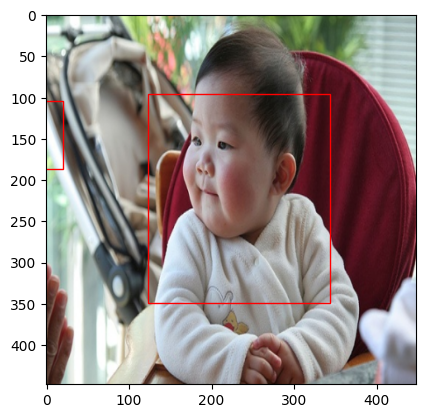

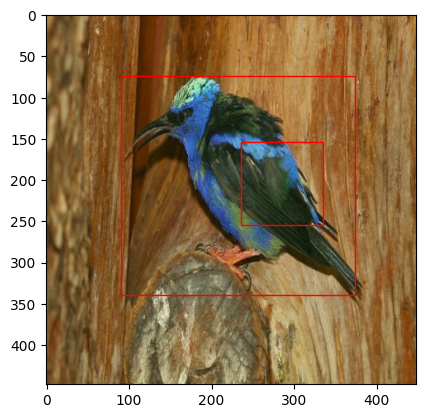

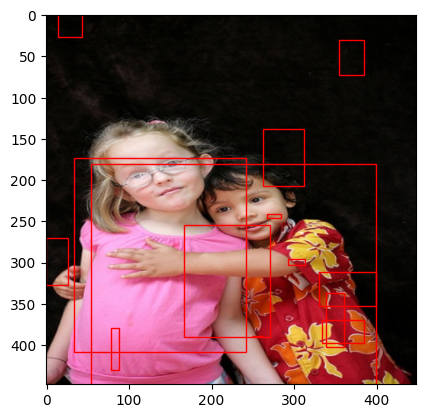

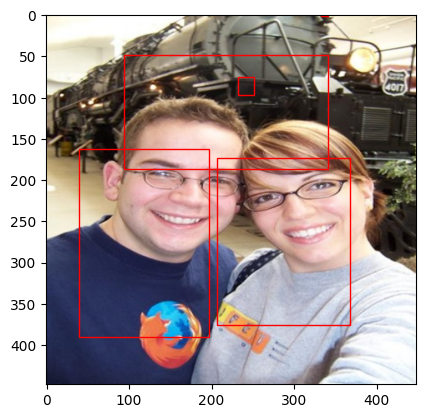

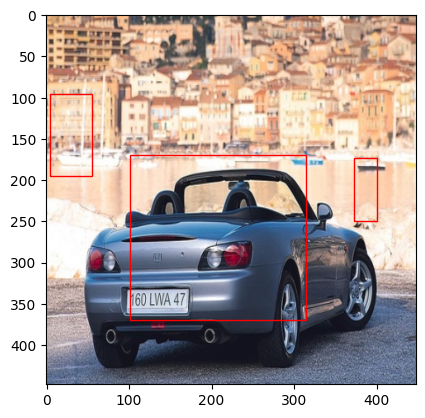

...

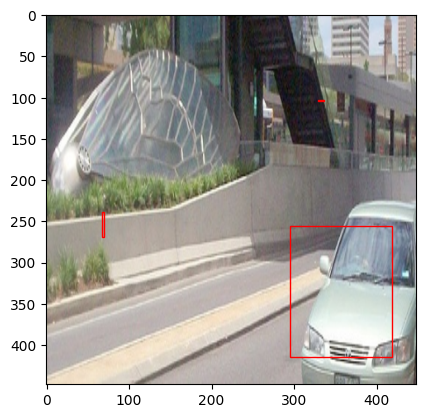

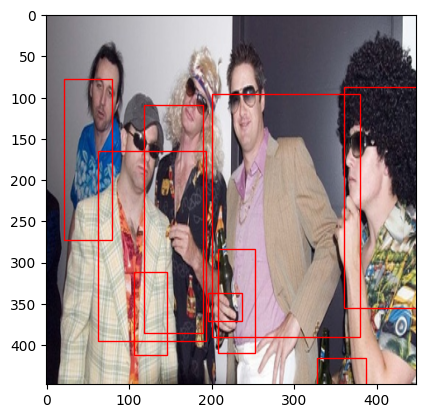

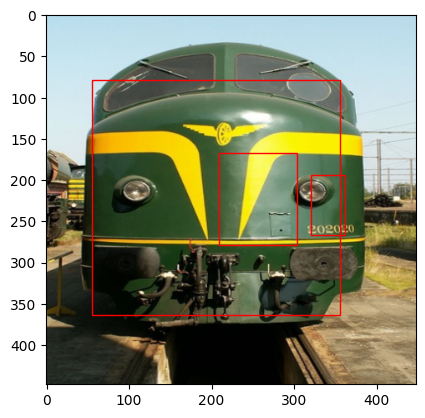

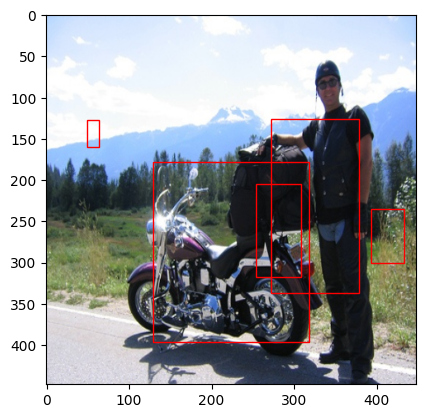

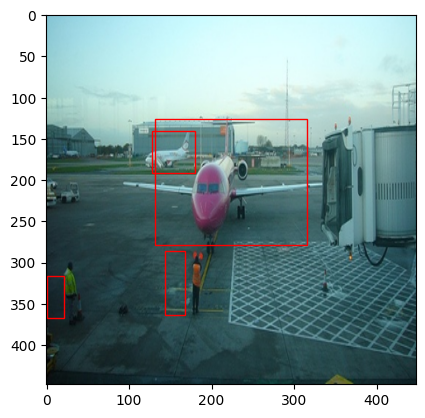

In [ ]:
for x, y in train_dataloader:
      x = x.to(device)
      for idx in range(8):
        bboxes = cellboxes_to_boxes(yolo_model(x))
        bboxes = non_max_suppression(bboxes[idx], iou_threshold=0.5, threshold=0.4, box_format="midpoint")
        plot_image(x[idx].permute(1,2,0).to("cpu"), bboxes)